# Setup

pip install `ultralytics` and [dependencies](https://github.com/ultralytics/ultralytics/blob/main/pyproject.toml) and check software and hardware.

[![PyPI - Version](https://img.shields.io/pypi/v/ultralytics?logo=pypi&logoColor=white)](https://pypi.org/project/ultralytics/) [![Downloads](https://static.pepy.tech/badge/ultralytics)](https://clickpy.clickhouse.com/dashboard/ultralytics) [![PyPI - Python Version](https://img.shields.io/pypi/pyversions/ultralytics?logo=python&logoColor=gold)](https://pypi.org/project/ultralytics/)

In [1]:
!uv pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.5/112.6 GB disk)


In [2]:
#@title Select YOLO11 🚀 logger {run: 'auto'}
logger = 'TensorBoard' #@param ['TensorBoard', 'Weights & Biases']

if logger == 'TensorBoard':
  !yolo settings tensorboard=True
  %load_ext tensorboard
  %tensorboard --logdir .
elif logger == 'Weights & Biases':
  !yolo settings wandb=True

✅ Updated 'tensorboard=True'
JSONDict("/root/.config/Ultralytics/settings.json"):
{
  "settings_version": "0.0.6",
  "datasets_dir": "/content/datasets",
  "weights_dir": "weights",
  "runs_dir": "runs",
  "uuid": "569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb",
  "sync": true,
  "api_key": "",
  "openai_api_key": "",
  "clearml": true,
  "comet": true,
  "dvc": true,
  "hub": true,
  "mlflow": true,
  "neptune": true,
  "raytune": true,
  "tensorboard": true,
  "wandb": false,
  "vscode_msg": true,
  "openvino_msg": true
}
💡 Learn more about Ultralytics Settings at https://docs.ultralytics.com/quickstart/#ultralytics-settings


<IPython.core.display.Javascript object>

In [3]:
# download dataset from roboflow
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="[API_KEY]")
project = rf.workspace("utarlddv1").project("nthuddd")
version = project.version(1)
dataset = version.download("yolov11")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 64.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 88.9 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to nthuddd-1 in yolov11:: 100%|██████████| 4484/4484 [00:00<00:00, 9764.09it/s] 


In [7]:
# Train YOLO11n 
!yolo train model=yolo11n.pt data=/content/nthuddd-1/data.yaml epochs=50 imgsz=640

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/nthuddd-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=

In [9]:
!yolo export model=/content/runs/detect/train4/weights/best.pt format=torchscript

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from '/content/runs/detect/train4/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (5.2 MB)

TorchScript: starting export with torch 2.8.0+cu126...
TorchScript: export success ✅ 2.9s, saved as '/content/runs/detect/train4/weights/best.torchscript' (10.3 MB)

Export complete (3.3s)
Results saved to /content/runs/detect/train4/weights
Predict:         yolo predict task=detect model=/content/runs/detect/train4/weights/best.torchscript imgsz=640  
Validate:        yolo val task=detect model=/content/runs/detect/train4/weights/best.torchscript imgsz=640 data=/content/nthuddd-1/data.yaml  
Visualize:       https://netron.app
💡 L


image 1/1 /content/nthuddd-1/test/images/309_jpg.rf.72a2aecfd189d251f1bff652ff66f631.jpg: 640x640 1 drowsy, 10.2ms
Speed: 2.0ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


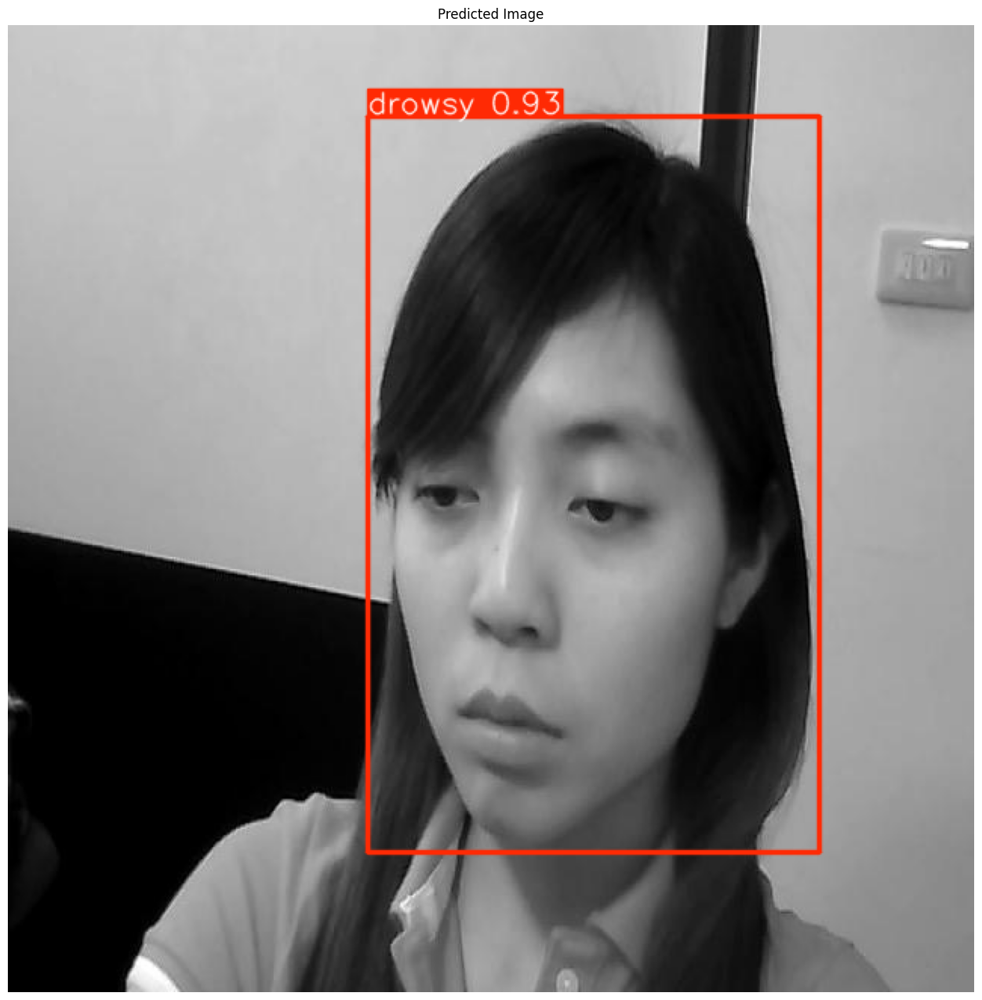

In [8]:
from ultralytics import YOLO

# Load a model
model = YOLO('/content/runs/detect/train2/weights/best.pt')  # load a pretrained model (recommended for training)

# Use the model
results = model('/content/nthuddd-1/test/images/309_jpg.rf.72a2aecfd189d251f1bff652ff66f631.jpg')  # predict on an image


# Convert result to a NumPy array and display
predicted_image = results[0].plot()  # Convert prediction to an image

# visualize the image
import matplotlib.pyplot as plt
plt.figure(figsize=(16, 16))
plt.imshow(predicted_image)
plt.axis("off")
plt.title("Predicted Image")
plt.show()

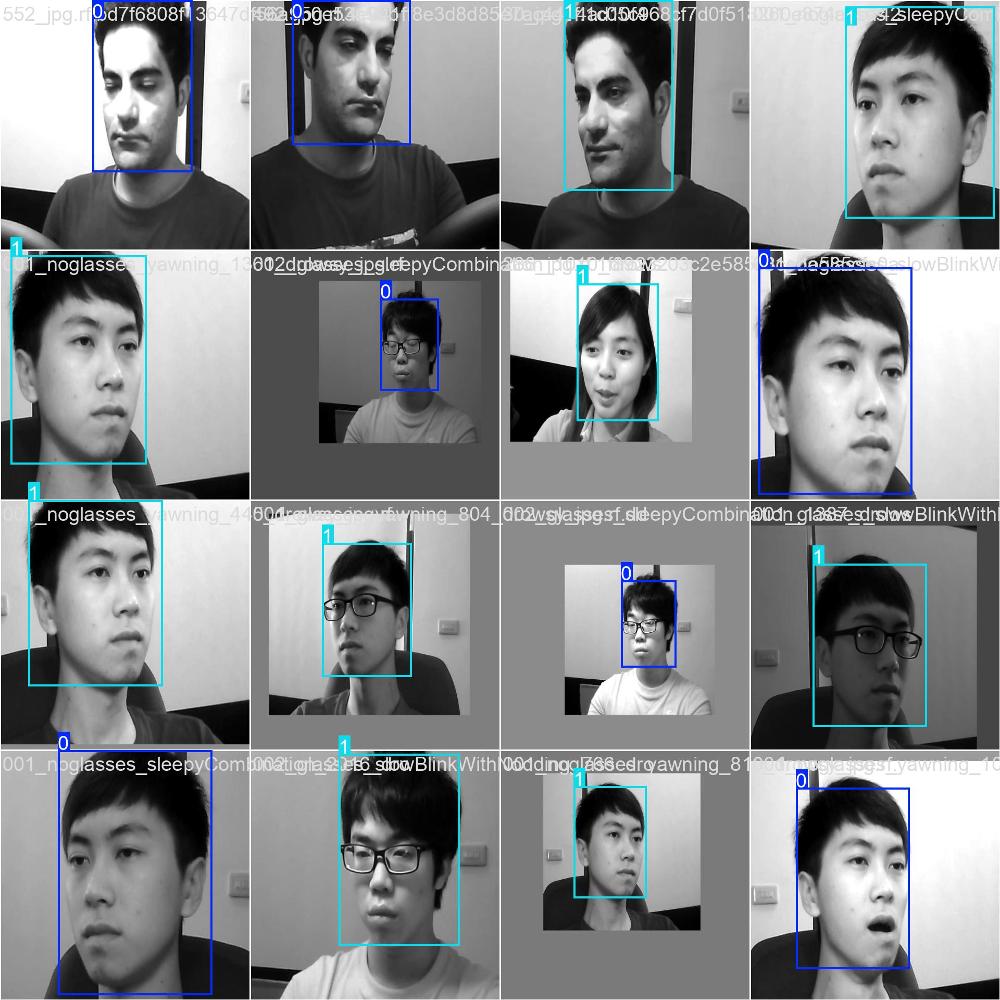

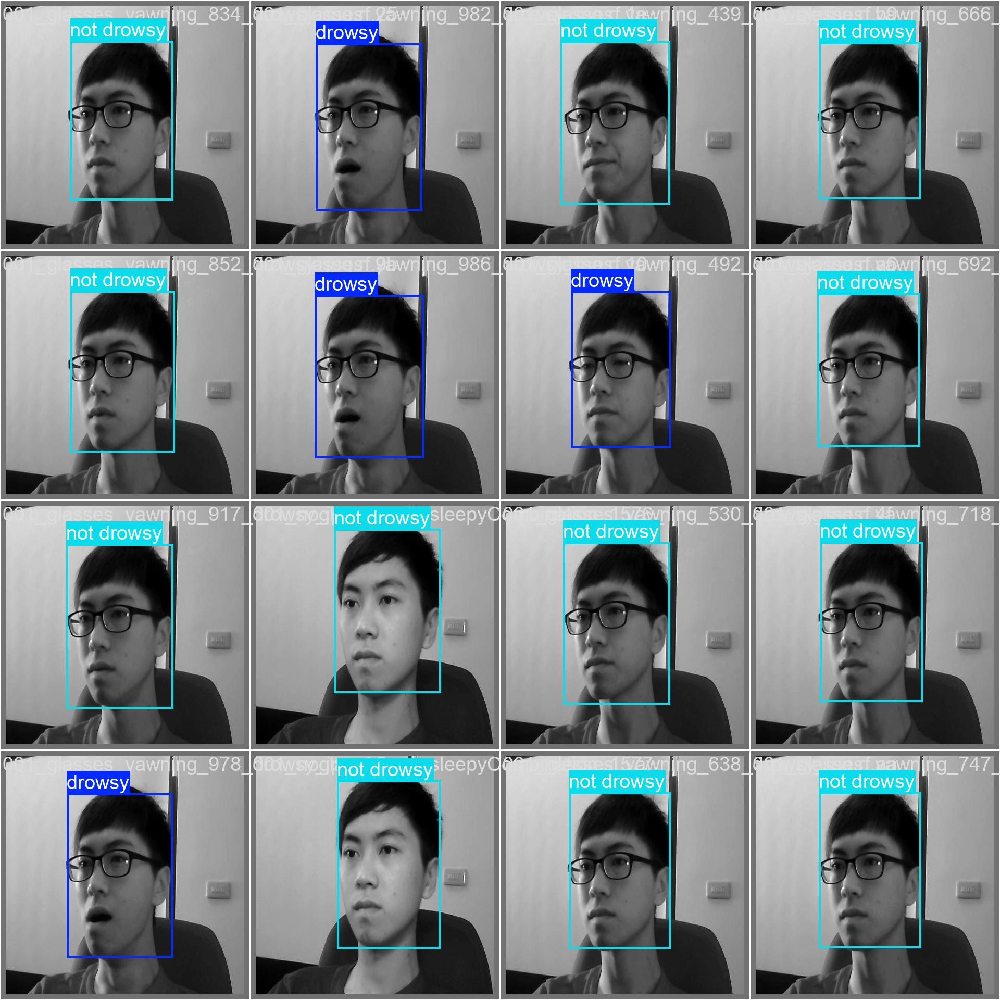

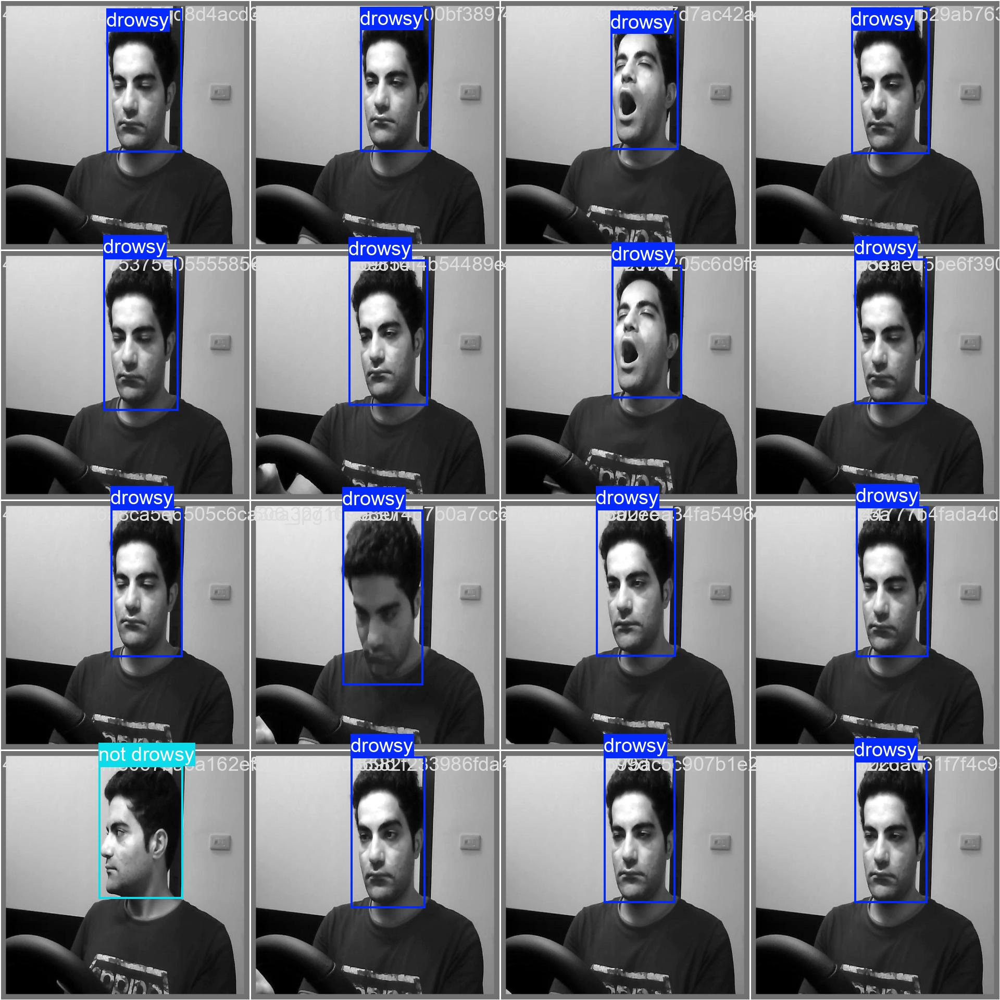

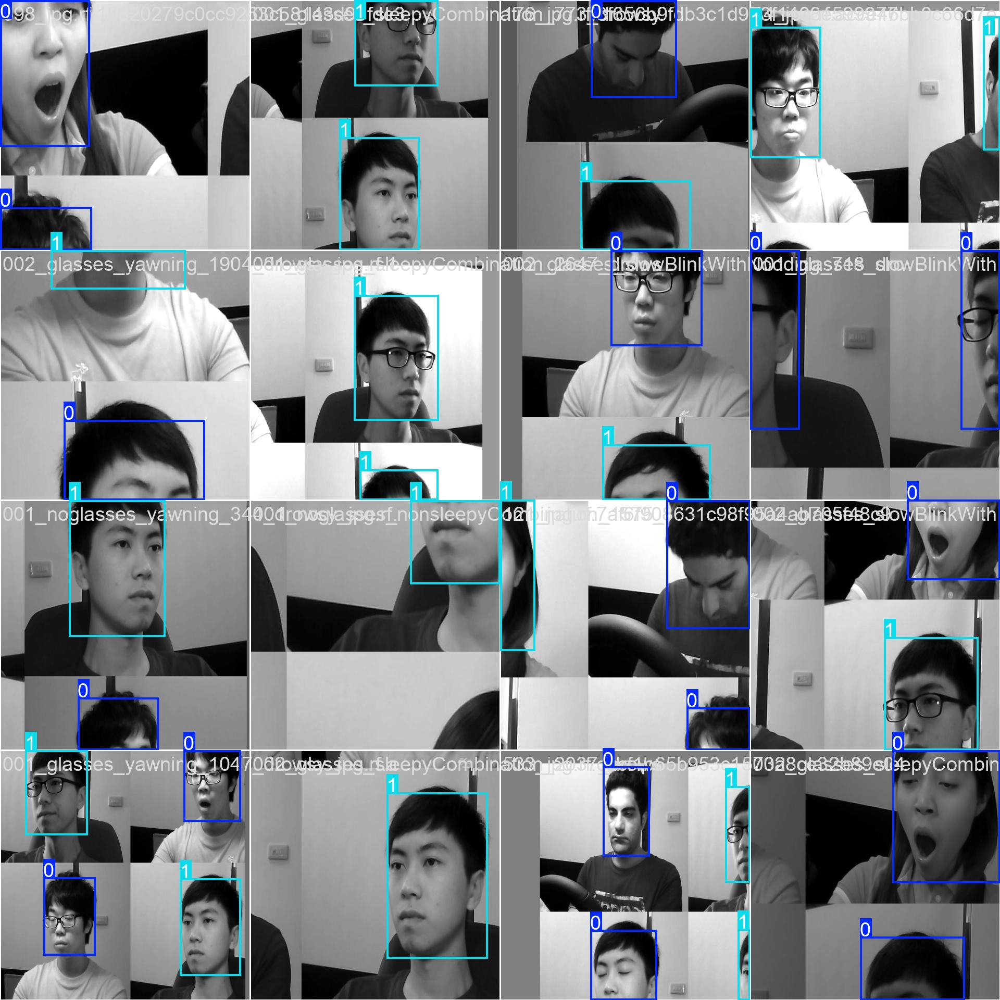

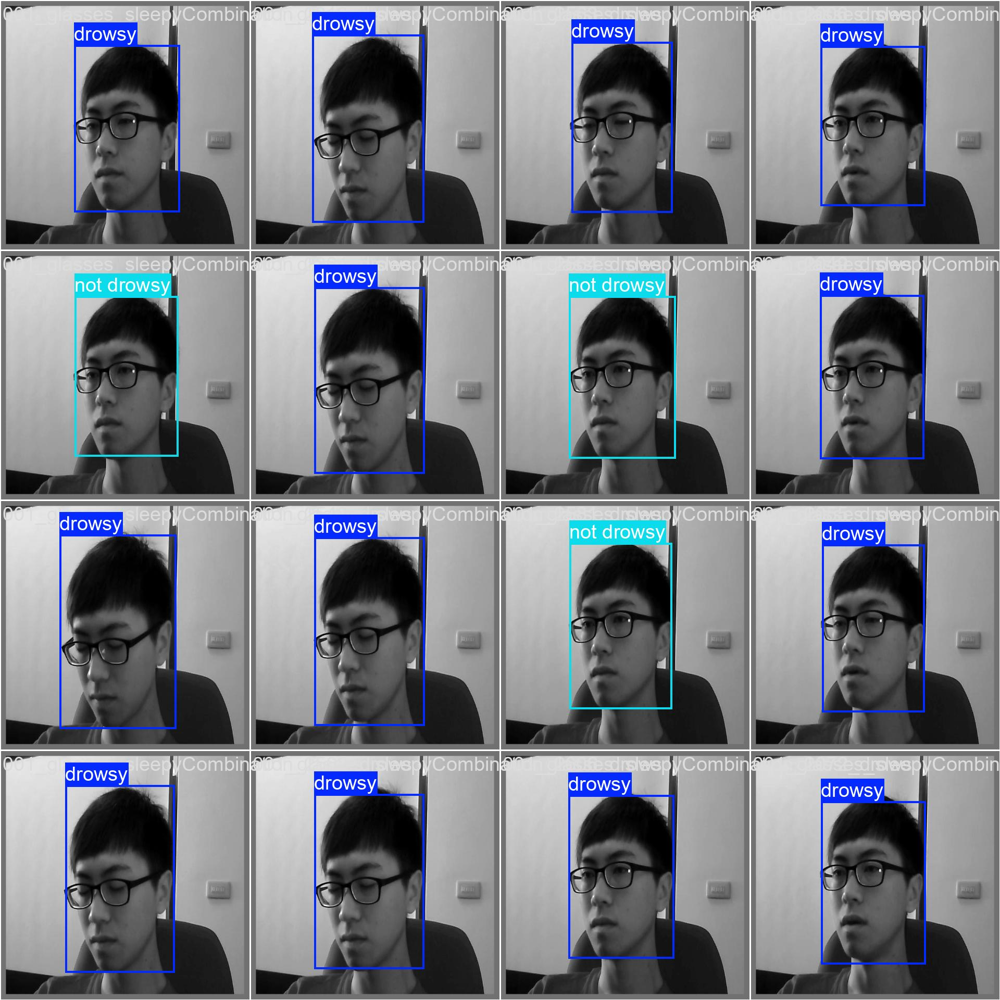

...

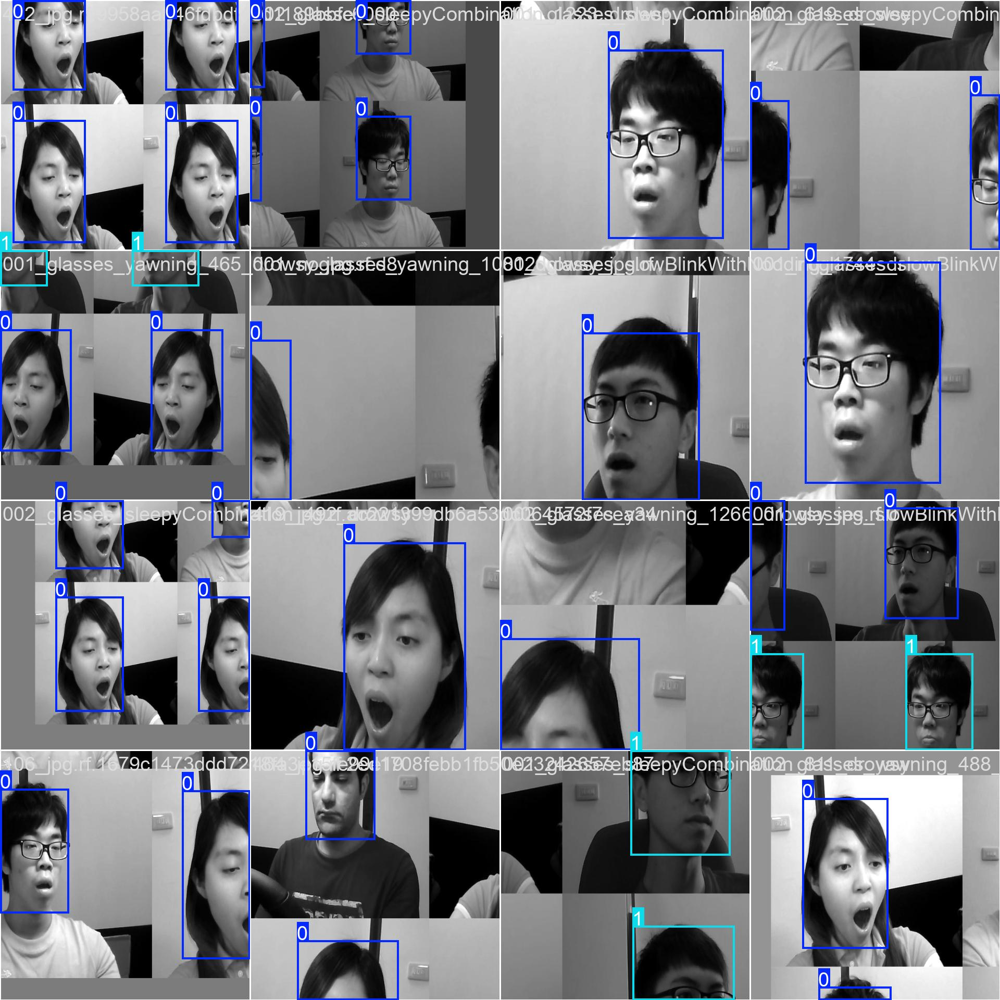

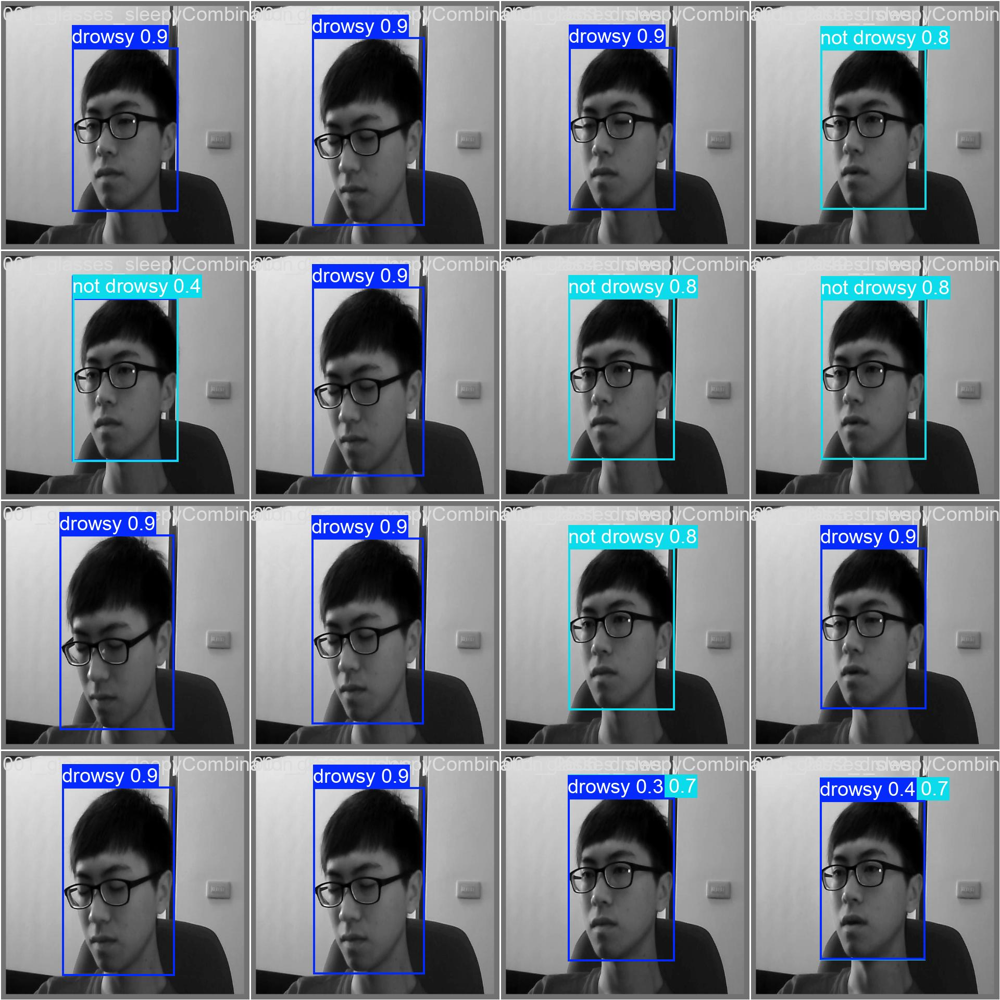

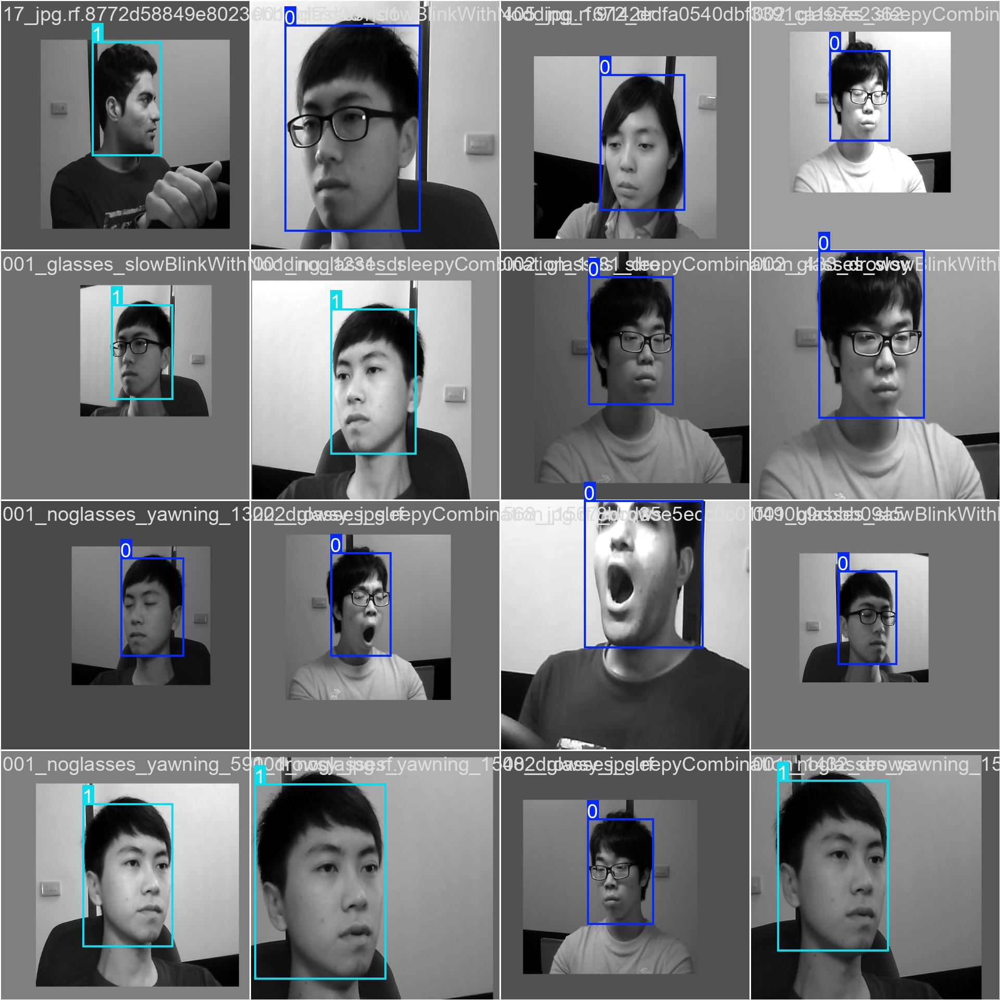

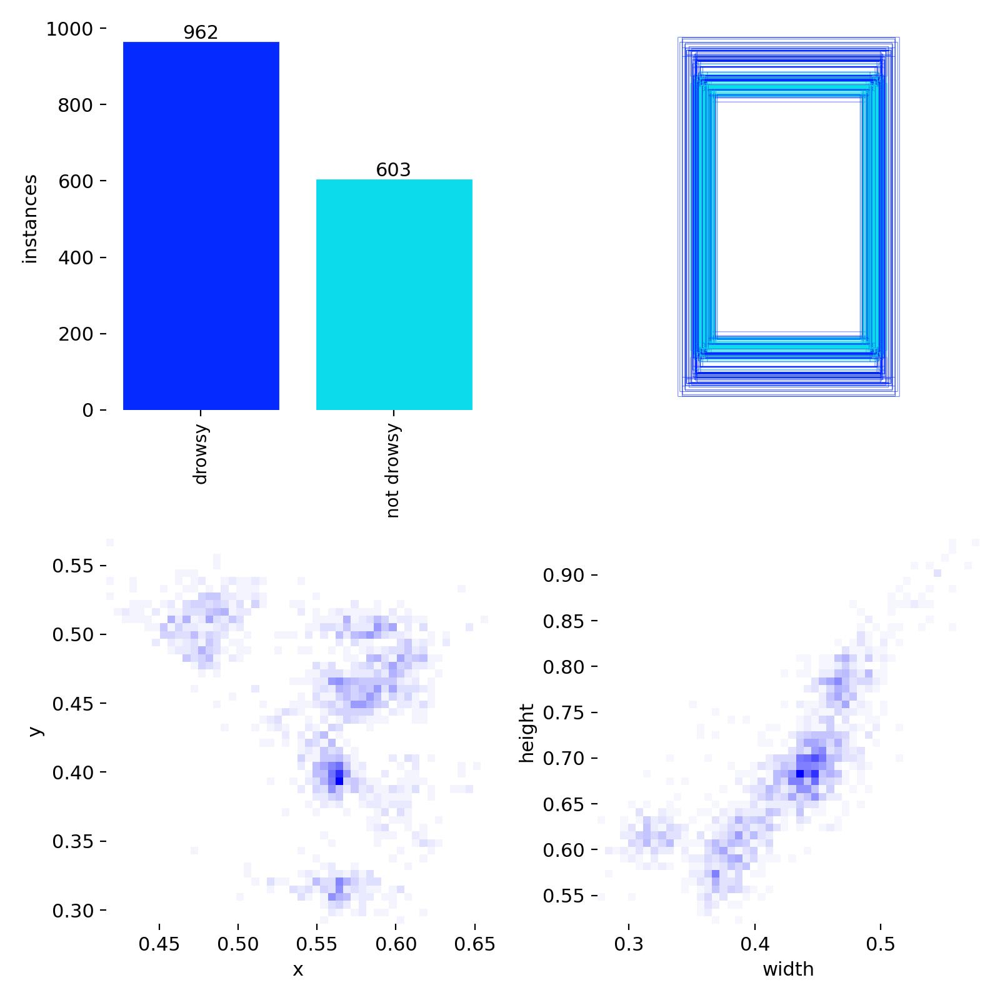

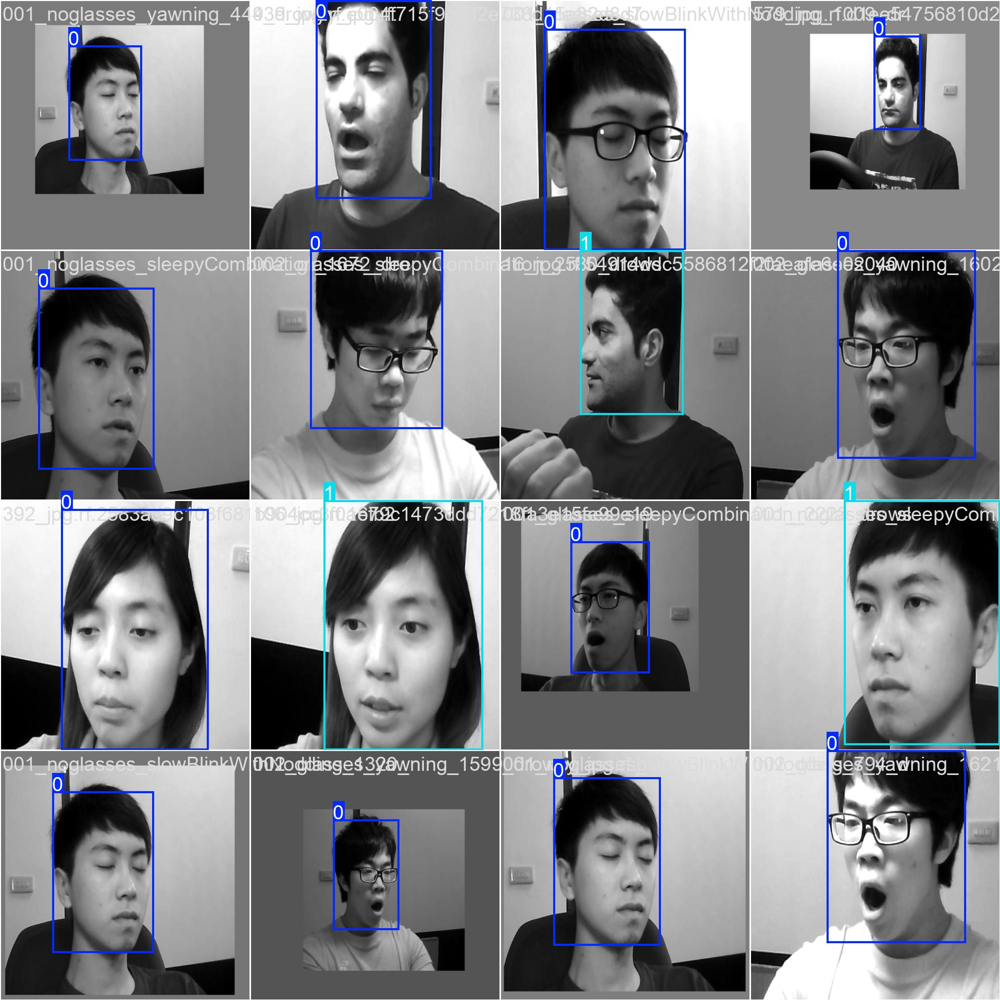

In [9]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/train2/*.jpg'):
  display(Image(filename=image_path, height=500))
  print("\n")